In [1]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from nuscenes.map_expansion.map_api import NuScenesMap
from nuscenes.nuscenes import NuScenes

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.642 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


/home/aleenatron/miniconda3/envs/frames_av/lib/python3.10/site-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


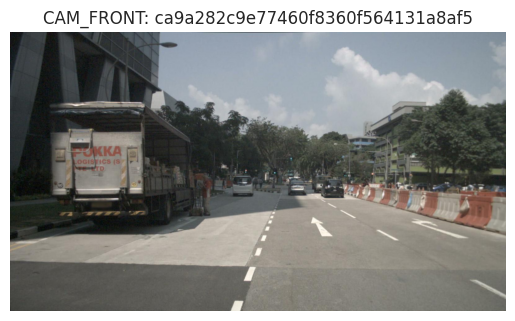

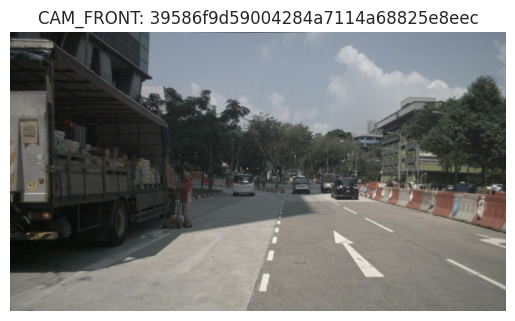

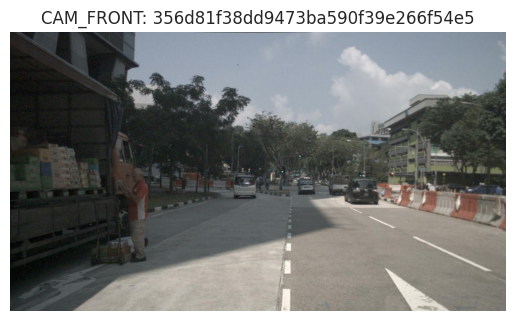

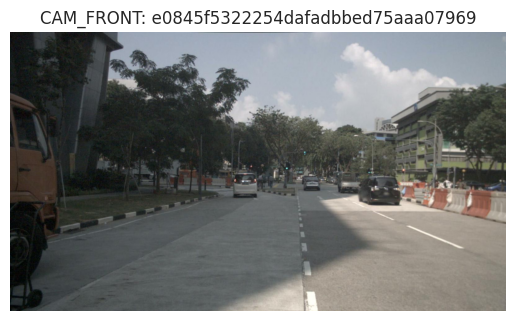

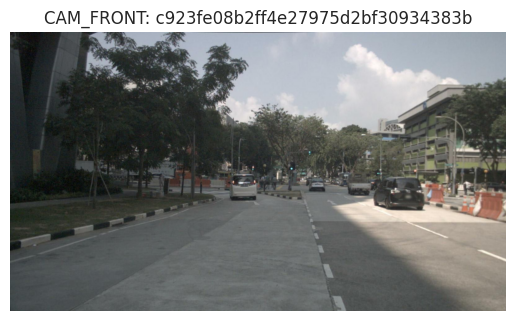

...

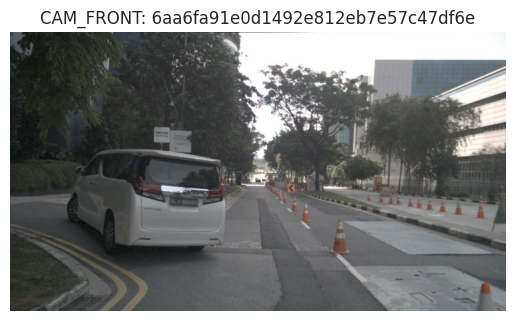

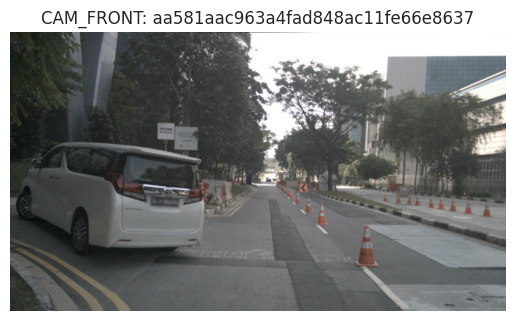

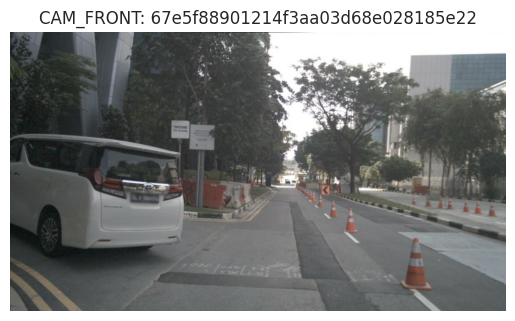

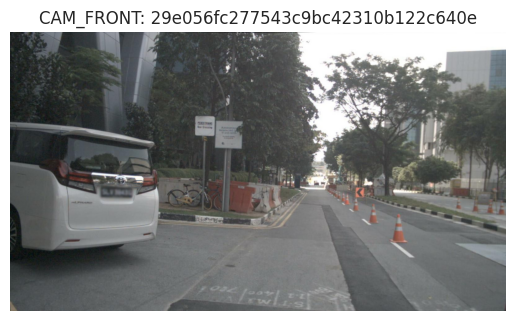

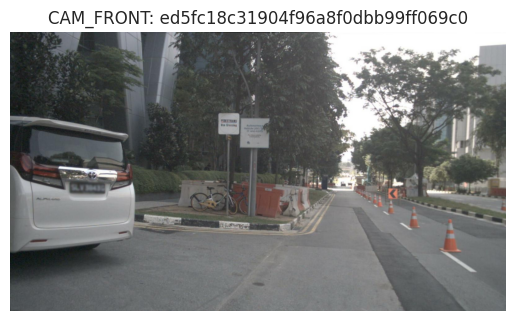

In [2]:
import os
from nuscenes.nuscenes import NuScenes
import matplotlib.pyplot as plt
import cv2
from transformers import DPTFeatureExtractor, DPTForDepthEstimation
import torch
from PIL import Image

# Initialize NuScenes
dataroot = '/home/aleenatron/Frames_AV_research'
nusc = NuScenes(version='v1.0-mini', dataroot=dataroot, verbose=True)

# Select scene with pedestrian crossings
scene_index = 0
scene = nusc.scene[scene_index]
sample_token = scene['first_sample_token']

# Loop through all samples in the scene
while sample_token:
    sample = nusc.get('sample', sample_token)
    
    # Get front camera image
    cam_token = sample['data']['CAM_FRONT']
    cam_data = nusc.get('sample_data', cam_token)
    image_path = os.path.join(nusc.dataroot, cam_data['filename'])

    # Optional: visualize
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-hybrid-midas")
    depth_model = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas")
    depth_model.eval()

    # Inside your while loop after img_rgb:
    img_pil = Image.fromarray(img_rgb)
    inputs = feature_extractor(images=img_pil, return_tensors="pt")

    with torch.no_grad():
        outputs = depth_model(**inputs)
        predicted_depth = outputs.predicted_depth

    depth = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=img_pil.size[::-1],
        mode="bicubic",
        align_corners=False
    ).squeeze().cpu().numpy()
    

    plt.imshow(img_rgb)
    plt.title(f"CAM_FRONT: {sample_token}")
    plt.axis("off")
    plt.show()

    # Move to next sample
    sample_token = sample['next']


In [6]:
!pip install transformers timm opencv-python matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 4.4 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 5.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 8.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 23.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 41.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 42.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 45.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 45.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 43.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/

In [4]:
output_dir = output_dir = '/home/aleenatron/Frames_capstone/Frame_AV'

output_dir = os.path.join(output_dir, 'depth_maps_cam_front')
os.makedirs(output_dir, exist_ok=True)


In [5]:
depth_save_path = os.path.join(output_dir, f"{sample_token}_depth.npy")
np.save(depth_save_path, depth)



In [6]:
depth_norm = (depth - depth.min()) / (depth.max() - depth.min())  # Normalize [0,1]
depth_uint8 = (depth_norm * 255).astype(np.uint8)
depth_png_path = os.path.join(output_dir, f"{sample_token}_depth.png")
cv2.imwrite(depth_png_path, depth_uint8)


True

In [7]:
cam_token = sample['data']['CAM_FRONT']
cam_data = nusc.get('sample_data', cam_token)
calib = nusc.get('calibrated_sensor', cam_data['calibrated_sensor_token'])
K = np.array(calib['camera_intrinsic'])  # 3x3


In [8]:
def depth_to_pointcloud(depth, K):
    H, W = depth.shape
    i, j = np.meshgrid(np.arange(W), np.arange(H), indexing='xy')
    
    # Create (u, v, 1) pixel coordinates
    pixels = np.stack((i, j, np.ones_like(i)), axis=-1).reshape(-1, 3).T  # [3, N]
    
    # Inverse intrinsics
    K_inv = np.linalg.inv(K)
    
    # Get 3D points in camera frame
    rays = K_inv @ pixels  # [3, N]
    points = rays * depth.reshape(1, -1)  # [3, N]

    return points.T  # [N, 3]


In [9]:
import matplotlib.pyplot as plt
import numpy

def plot_bev_and_save(points, save_path, side_range=(-30, 30), fwd_range=(0, 60), res=0.1):
    """
    Generate and save BEV image from 3D points.
    """
    x_points = points[:, 0]
    z_points = points[:, 2]  # forward

    # Filter points within the BEV bounds
    x_filt = np.logical_and(x_points > side_range[0], x_points < side_range[1])
    z_filt = np.logical_and(z_points > fwd_range[0], z_points < fwd_range[1])
    valid = np.logical_and(x_filt, z_filt)
    x = x_points[valid]
    z = z_points[valid]

    # Convert to BEV image coordinates
    x_img = ((x - side_range[0]) / res).astype(np.int32)
    z_img = ((z - fwd_range[0]) / res).astype(np.int32)

    # Create BEV canvas
    x_max = int((side_range[1] - side_range[0]) / res)
    z_max = int((fwd_range[1] - fwd_range[0]) / res)
    bev_img = np.zeros((z_max, x_max), dtype=np.uint8)

    # Set white pixels where points fall
    bev_img[z_img, x_img] = 255

    # Flip vertically for correct orientation
    bev_img = np.flipud(bev_img)

    # Plot and save
    plt.imshow(bev_img, cmap='gray')
    plt.axis("off")
    plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
    plt.close()

In [10]:
import os
import numpy as np
import torch
import cv2
from PIL import Image
from nuscenes.nuscenes import NuScenes
from transformers import DPTFeatureExtractor, DPTForDepthEstimation
import matplotlib.pyplot as plt

# Load model
feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-hybrid-midas")
depth_model = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas")
depth_model.eval()

# NuScenes setup
dataroot = '/home/aleenatron/Frames_AV_research'
output_root = '/home/aleenatron/Frames_capstone/Frame_AV'
nusc = NuScenes(version='v1.0-mini', dataroot=dataroot, verbose=False)
scene = nusc.scene[0]
sample_token = scene['first_sample_token']

# Output folder
os.makedirs(f"{output_root}/depth_pointclouds", exist_ok=True)
os.makedirs(f"{output_root}/depth_pointclouds/bev_images", exist_ok=True)

# Get intrinsics (constant for CAM_FRONT)
first_sample = nusc.get('sample', sample_token)
cam_token = first_sample['data']['CAM_FRONT']
cam_data = nusc.get('sample_data', cam_token)
calib = nusc.get('calibrated_sensor', cam_data['calibrated_sensor_token'])
K = np.array(calib['camera_intrinsic'])

# --- Depth to point cloud function ---
def depth_to_pointcloud(depth, K):
    H, W = depth.shape
    i, j = np.meshgrid(np.arange(W), np.arange(H), indexing='xy')
    pixels = np.stack((i, j, np.ones_like(i)), axis=-1).reshape(-1, 3).T  # [3, N]
    K_inv = np.linalg.inv(K)
    rays = K_inv @ pixels
    points = rays * depth.reshape(1, -1)
    return points.T  # [N, 3]

# --- Loop over all samples ---
while sample_token:
    sample = nusc.get('sample', sample_token)
    cam_token = sample['data']['CAM_FRONT']
    cam_data = nusc.get('sample_data', cam_token)
    image_path = os.path.join(nusc.dataroot, cam_data['filename'])

    # Read and convert image
    img_bgr = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)

    # Depth estimation
    inputs = feature_extractor(images=img_pil, return_tensors="pt")
    with torch.no_grad():
        outputs = depth_model(**inputs)
        predicted_depth = outputs.predicted_depth

    depth = torch.nn.functional.interpolate(
        predicted_depth.unsqueeze(1),
        size=img_pil.size[::-1],
        mode="bicubic",
        align_corners=False
    ).squeeze().cpu().numpy()

    # Project to 3D
    points_3d = depth_to_pointcloud(depth, K)  # [N, 3]
    points_3d = points_3d[(points_3d[:, 2] > 0.1) & (points_3d[:, 2] < 80)]  # z filtering
    bev_out_path = os.path.join(output_root, "depth_pointclouds", "bev_images", f"{sample_token}_bev.png")
    plot_bev_and_save(points_3d, bev_out_path)
    # Save as .npy
    save_path = os.path.join(output_root, "depth_pointclouds", f"{sample_token}_points.npy")
    np.save(save_path, points_3d)

    print(f"Saved point cloud with {len(points_3d)} points → {save_path}")

    sample_token = sample['next']


/home/aleenatron/miniconda3/envs/frames_av/lib/python3.10/site-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


Saved point cloud with 136712 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/ca9a282c9e77460f8360f564131a8af5_points.npy
Saved point cloud with 143942 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/39586f9d59004284a7114a68825e8eec_points.npy
Saved point cloud with 152708 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/356d81f38dd9473ba590f39e266f54e5_points.npy
Saved point cloud with 31659 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/e0845f5322254dafadbbed75aaa07969_points.npy
Saved point cloud with 77086 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/c923fe08b2ff4e27975d2bf30934383b_points.npy
Saved point cloud with 42164 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/f1e3d9d08f044c439ce86a2d6fcca57b_points.npy
Saved point cloud with 56756 points → /home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/4f545737bf3347fbbc9af60b0be9a963_points.npy
Sav

In [11]:
!pip install transformers timm accelerate


In [15]:
!pip uninstall protobuf -y
!pip install protobuf==3.20.3



Found existing installation: protobuf 3.20.3
Uninstalling protobuf-3.20.3:
  Successfully uninstalled protobuf-3.20.3
  Using cached protobuf-3.20.3-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl.metadata (679 bytes)
Using cached protobuf-3.20.3-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (1.1 MB)


In [16]:
!rm -rf ~/.cache/huggingface/transformers
!rm -rf ~/.cache/huggingface/hub

In [4]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image
import torch
import os

# Load BLIP image captioning model (no prompt needed)
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base", torch_dtype=torch.float16).cuda().eval()

bev_dir = "/home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/bev_images"
output_txt = "/home/aleenatron/Frames_capstone/Frame_AV/bev_captions.txt"

with open(output_txt, "w") as f_out:
    for fname in sorted(os.listdir(bev_dir)):
        if not fname.endswith(".png"):
            continue
        img_path = os.path.join(bev_dir, fname)
        image = Image.open(img_path).convert("RGB")

        # No prompt needed
        inputs = processor(images=image, return_tensors="pt").to("cuda", torch.float16)

        with torch.no_grad():
            out = model.generate(**inputs, max_new_tokens=100)

        caption = processor.decode(out[0], skip_special_tokens=True)
        print(f"{fname}: {caption}")
        f_out.write(f"{fname}: {caption}\n")



config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

023c4df2d451409881d8e6ea82f14704_bev.png: a black and white image of a triangle
0cd661df01aa40c3bb3a773ba86f753a_bev.png: a black and white image of a shark
1e3d79dae62742a0ad64c91679863358_bev.png: a black and white image of a shark
29e056fc277543c9bc42310b122c640e_bev.png: a black and white image of a space shuttle
2afb9d32310e4546a71cbe432911eca2_bev.png: a black and white image of a diamond
2ff86dc19c4644a1a88ce5ba848f56e5_bev.png: a black and white image of a diamond
356d81f38dd9473ba590f39e266f54e5_bev.png: a black and white image of a diamond
378a3a3e9af346308ab9dff8ced46d9c_bev.png: a black and white image of a whale
39586f9d59004284a7114a68825e8eec_bev.png: a black and white image of a triangle
4246e57f018745c9b2bc68feb3d71b58_bev.png: a black and white image of a bird
4711bcd34644420da8bc77163431888e_bev.png: a black and white image of a lightning
4f545737bf3347fbbc9af60b0be9a963_bev.png: a black and white image of a plane
5fda58ee3ae44ab9b4bbac7a2de66c27_bev.png: a black and

In [7]:
# Load caption pool from file
caption_pool = []
with open("scene_0_frame_descriptions.txt") as f:
    for block in f.read().strip().split("\n\n"):
        caption_pool.append(block.split(": ", 1)[1])  # skip name, keep description


In [11]:
import clip
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Embed all captions
MAX_WORDS = 70
caption_pool_clipped = [" ".join(c.split()[:MAX_WORDS]) for c in caption_pool]
text_tokens = clip.tokenize(caption_pool_clipped, truncate=True).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)


In [12]:
import os
from PIL import Image
import torch
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# --- Load and tokenize descriptions ---
MAX_WORDS = 70
with open("scene_0_frame_descriptions.txt") as f:
    raw_pool = [block.split(": ", 1)[1] for block in f.read().strip().split("\n\n")]

caption_pool_clipped = [" ".join(c.split()[:MAX_WORDS]) for c in raw_pool]
text_tokens = clip.tokenize(caption_pool_clipped, truncate=True).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# --- Match BEV to best description ---
bev_dir = "/home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/bev_images"
output_txt = "/home/aleenatron/Frames_capstone/Frame_AV/bev_clip_captions.txt"

with open(output_txt, "w") as f_out:
    for fname in sorted(os.listdir(bev_dir)):
        if not fname.endswith(".png"):
            continue

        image_path = os.path.join(bev_dir, fname)
        image = preprocess(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)

        with torch.no_grad():
            image_features = model.encode_image(image)
            image_features /= image_features.norm(dim=-1, keepdim=True)

            similarity = (image_features @ text_features.T).squeeze(0)
            best_idx = similarity.argmax().item()
            best_caption = caption_pool_clipped[best_idx]

            print(f"{fname}: {best_caption}")
            f_out.write(f"{fname}: {best_caption}\n")



023c4df2d451409881d8e6ea82f14704_bev.png: A vehicle.car moved dominantly backward, then moved diagonally, then moved dominantly left. Relative to the ego vehicle, it was crossed from right to left laterally and crossed from ahead to behind longitudinally. It covered a total distance of approximately 154.62m over 18.05s. Mean distance: 55.50m, closest approach: 42.44m. Its orientation over time was: facing leftward (perpendicular), then facing same direction.
0cd661df01aa40c3bb3a773ba86f753a_bev.png: A movable_object.barrier moved dominantly backward, then moved diagonally. Relative to the ego vehicle, it was crossed from left to right laterally and crossed from ahead to behind longitudinally. It covered a total distance of approximately 98.84m over 17.60s. Mean distance: 27.93m, closest approach: 13.33m. Its orientation over time was: facing same direction, then facing rightward (perpendicular).
1e3d79dae62742a0ad64c91679863358_bev.png: A human.pedestrian.construction_worker moved domi

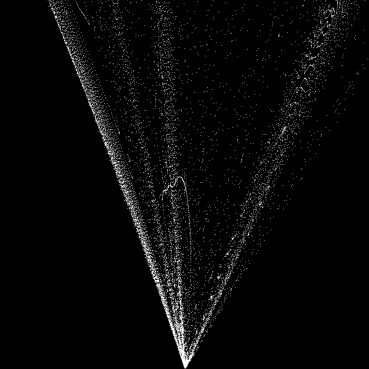

In [15]:
from IPython.display import Image as IPImage, display

img_path = "/home/aleenatron/Frames_capstone/Frame_AV/depth_pointclouds/bev_images/023c4df2d451409881d8e6ea82f14704_bev.png"
display(IPImage(img_path))


In [13]:
import matplotlib.pyplot as plt
import cv2

def show_bev_with_caption(img_path, caption):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.title("\n".join(caption.split(". ")[:3]), fontsize=10)  # wrap long caption
    plt.axis("off")
    plt.show()


In [17]:
matched_caption ="A vehicle.car moved dominantly backward, then moved diagonally, then moved dominantly left. Relative to the ego vehicle, it was crossed from right to left laterally and crossed from ahead to behind longitudinally. It covered a total distance of approximately 154.62m over 18.05s. Mean distance: 55.50m, closest approach: 42.44m. Its orientation over time was: facing leftward (perpendicular), then facing same direction."

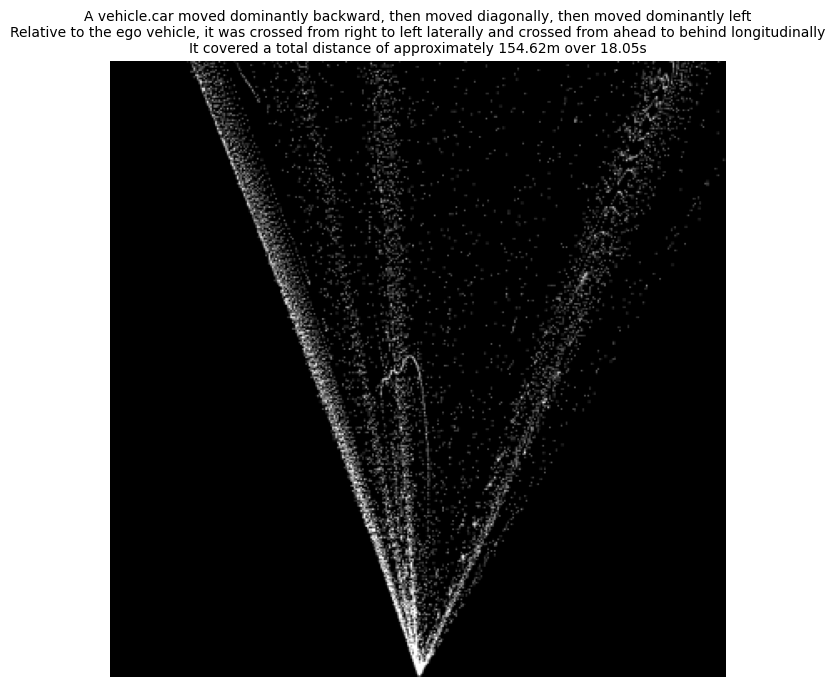

In [18]:
show_bev_with_caption(img_path, matched_caption)
